**Before running code below make sure that Visual NLP and dependencies are installed.**

This demo notebook misses installation section. Check Visual NLP documentation for installation manual.

In [1]:
import os

os.environ['SPARK_OCR_LICENSE'] = ""

from pyspark import SparkConf
from sparkocr import start

conf = SparkConf()\
.set("spark.kryoserializer.buffer.max", "2047")\
.set("spark.executor.memory", "32g")\
.set("spark.driver.memory","32g")

spark = start(jar_path="/home/ec2-user/", extra_conf=conf)

spark

Spark version: 3.5.0
Spark NLP version: 5.4.1
Spark OCR version: 5.5.0rc2

:: loading settings :: url = jar:file:/home/ec2-user/.local/lib/python3.9/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /home/ec2-user/.ivy2/cache
The jars for the packages stored in: /home/ec2-user/.ivy2/jars
com.johnsnowlabs.nlp#spark-nlp_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-0190b53f-0261-4d9e-900c-867dba06bd85;1.0
	confs: [default]
	found com.johnsnowlabs.nlp#spark-nlp_2.12;5.4.1 in central
	found com.typesafe#config;1.4.2 in central
	found org.rocksdb#rocksdbjni;6.29.5 in central
	found com.amazonaws#aws-java-sdk-s3;1.12.500 in central
	found com.amazonaws#aws-java-sdk-kms;1.12.500 in central
	found com.amazonaws#aws-java-sdk-core;1.12.500 in central
	found commons-logging#commons-logging;1.1.3 in central
	found commons-codec#commons-codec;1.15 in central
	found org.apache.httpcomponents#httpclient;4.5.13 in central
	found org.apache.httpcomponents#httpcore;4.4.13 in central
	found software.amazon.ion#ion-java;1.0.2 in central
	found joda-time#joda-time;2.8.1 in central
	found com.amazonaws#jmespath-java;1.12.500 in ce

# Image input file

In [2]:
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images, display_tables, display_pdf
from pyspark.ml import PipelineModel

In [3]:
imagePath = "/home/ec2-user/PubMed1_images_/*.jpg"

df = spark.read.format("binaryFile").load(imagePath)

bin_to_image = BinaryToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .setImageType(ImageType.TYPE_3BYTE_BGR)

df = bin_to_image.transform(df).cache()
df = df.limit(2)
df.show()

+--------------------+---------+--------------------+-------------------+-------+-------+
|               image|exception|                path|   modificationTime| length|pagenum|
+--------------------+---------+--------------------+-------------------+-------+-------+
|{file:/home/ec2-u...|     NULL|file:/home/ec2-us...|2024-05-24 13:50:13|1438004|      0|
|{file:/home/ec2-u...|     NULL|file:/home/ec2-us...|2024-05-17 10:36:42|1043573|      0|
+--------------------+---------+--------------------+-------------------+-------+-------+




    Image #0:
    Origin: file:/home/ec2-user/PubMed1_images_/main_1__4.jpg
    Resolution: 150 dpi
    Width: 1241 px
    Height: 1654 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


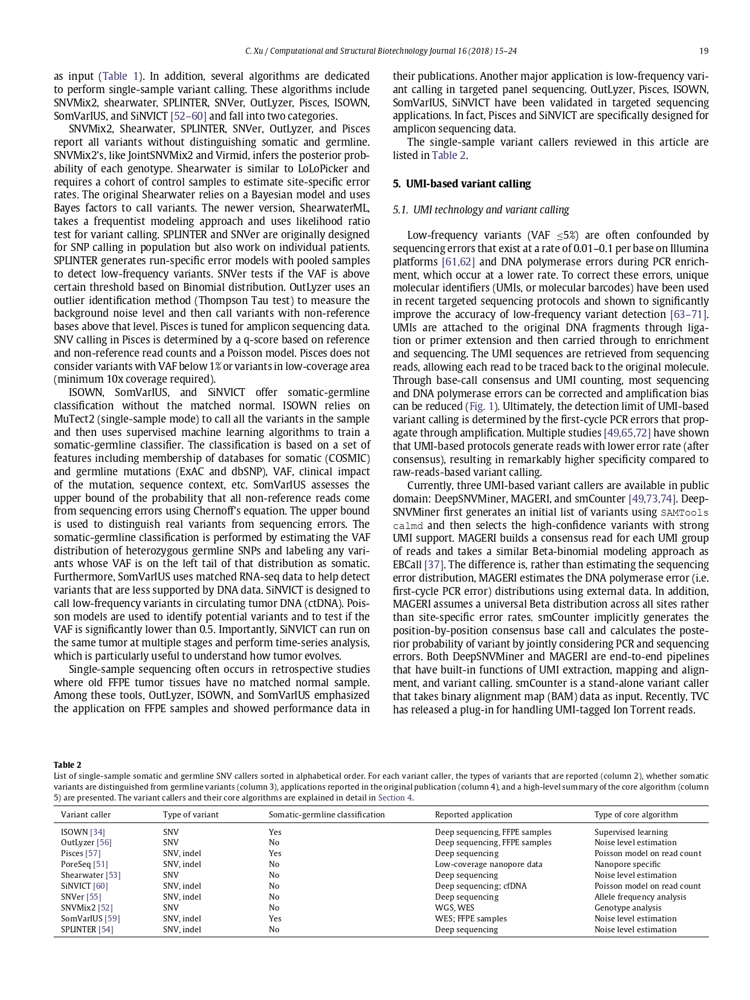


    Image #1:
    Origin: file:/home/ec2-user/PubMed1_images_/823__3.jpg
    Resolution: 150 dpi
    Width: 1257 px
    Height: 1632 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


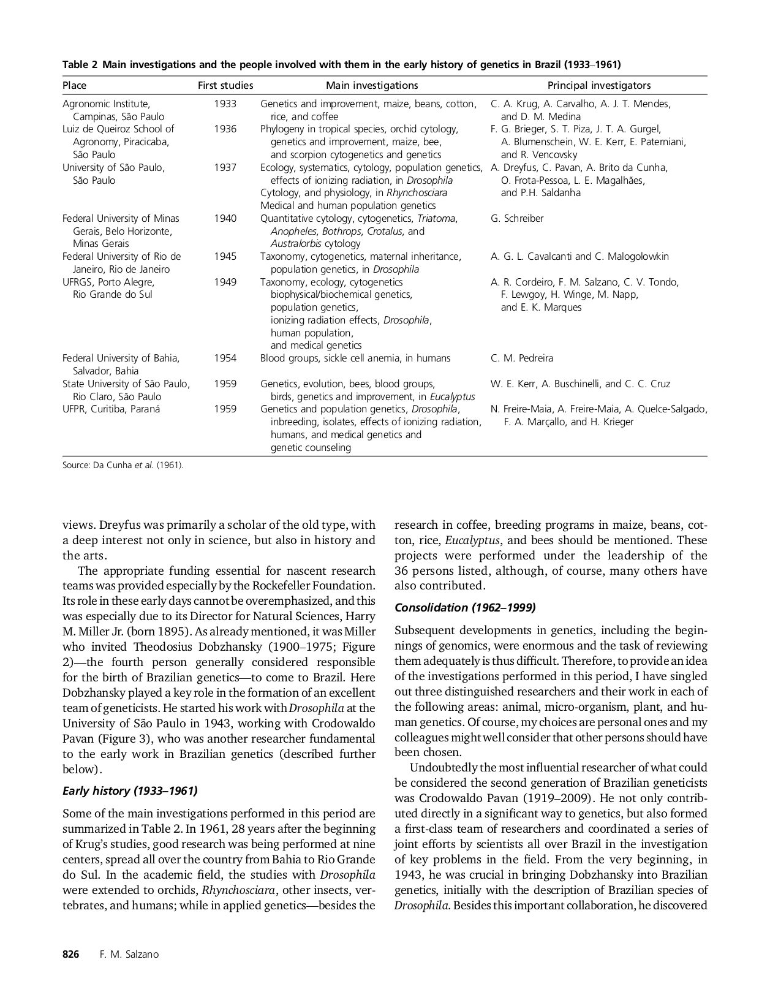

In [4]:
display_images(df)

In [5]:
proc = VisualDocumentProcessor() \
    .setInputCol("image") \
    .setOutputCols(["text", "tables"]) \
    .setFreeTextOnly(True) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)
result = proc.transform(df).cache()
result.show()

10:09:37, INFO Run visual document processor
10:09:46, INFO Going to convert document batch...
10:10:03, WARNING Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
10:10:08, INFO Processing document tmp
10:11:36, INFO Finished converting document tmp in 109.57 sec.
10:11:36, INFO Run visual document processor
10:11:36, INFO Going to convert document batch...
10:11:36, WARNING Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
10:11:38, INFO Processing document tmp
10:12:59, INFO Finished converting document tmp in 83.32 sec.
                                                                                

+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+
|               image|                path|   modificationTime| length|pagenum|                text|              tables|exception|
+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+
|{file:/home/ec2-u...|file:/home/ec2-us...|2024-05-24 13:50:13|1438004|      0|[45 input (Table ...|[{NULL, [[{ISOWN ...|     NULL|
|{file:/home/ec2-u...|file:/home/ec2-us...|2024-05-17 10:36:42|1043573|      0|[<missing-text>\n...|[{NULL, [[{Agrono...|     NULL|
+--------------------+--------------------+-------------------+-------+-------+--------------------+--------------------+---------+



In [6]:
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)

45 input (Table 1) In addition;  several algorithms are dedicated to perform single-sample variant calling: These algorithms include SNVMix2, shearwater; SPLINTER  SNVer; OutLyzer; Pisces; ISOWN, SomVarIUS, and SiNVICT [52-60] and fall into two categories.

ISOWN, SomVarIUS , and SiNVICT offer somatic-germline classification without   the matched norMal ISOWN relies OII MuTect2 (single-sample mode) to call all the variants in the sample and then uses supervised machine learning algorithms to train 4 somatic-germline classifier. The classification is based on d set of features including membership of databases for somatic (COSMIC) and  germline mutations (ExAC and dbSNP) VAF, clinical impact of the mutation; sequence context; etc. SomVarIUS assesses   the upper bound of the probability that all non-reference reads come from sequencing errors using Chernoff's equation. The upper bound is  used to distinguish  real variants   from sequencing errors. The somatic-germline classification is 

In [7]:
from pyspark.sql.functions import explode, col, monotonically_increasing_id
result = result.withColumn("table", explode(col("tables"))).withColumn("id", monotonically_increasing_id())
display_tables(result, table_col = "table", table_index_col = "id", empty_val = "")

Filename: main_1__4.jpg
Page: 0
Table: 0
Number of Columns: 5


col0,col1,col2,col3,col4
ISOWN [ 34],SNV,Yes,sequencing FFPE samples Dcep,Supervised learning
OutLyzer [56],SNV,No,"Decp sequencing, FFPE samples",Noise level estimtion
Pisces [57],"SNV , indel",Yes,Dccp sequencing,Poisson modcl on read count
PoreScq [51],"SNV , indel",No,Low-coverage nanopore data,Nanopore spccific
Shearwater [53],SNV,No,Deep sequencing,Noise level estimation
SiNVICT [60],"SNV , indel",No,Decp sequencing; cfDNA,Poisson model on read count
SNVer [55],"SNV , indel",No,Dccp scquencing,Allele frequency Jnalysis
SNVMix2 [52],SNV,No,"WGS, WES",Genotype analysis
SomVarlUS [59],"SNV , indel",Yes,WES; FFPE samples,Noise level estimation
SPLINTER [54],"SNV , indel",No,Dcep sequencing,Noise level estimation


Filename: 823__3.jpg
Page: 0
Table: 1
Number of Columns: 4


col0,col1,col2,col3
Agronomic Institute; Campinas; São Paulo,1933,"Genetics and improvement; maize; beans, cotton, rice; and coffee","C A A. Carvalho; A. J. T. Mendes , and D M Medina Krug,"
"Luiz de Queiroz School of Agronomy , Piracicaba; São Paulo",1936,"Phylogeny in tropical species, orchid cytology, genetics and improvement, maize; bee, and scorpion cytogenetics and genetics","F.G. Brieger, 5. T. Piza, J. T. A. Gurgel A. Blumenschein, W. E. Kerr, E. Paterniani and R. Vencovsky"
"University of São Paulo , São Paulo",1937,"Ecology, systema cytology, population genetics; effects of ionizing radiation; in Drosophila Cytology; and physiology, in Rhynchosciara tics,","4 Dreyfus; C Pavan A. Brito da Cunha, 0. Frota-Pessoa; L. E. Magalhães , and PH. Saldanha"
"Federal University of Minas Gerais , Belo Horizonte Minas Gerais",1940,"Medical and human population genetics Quantitative cytology , cytogenetics; Triatoma; Anopheles; Bothrops; Crotalus, and Australorbis cytology",G. Schreiber
Federal University of Rio de Janeiro; Rio de Janeiro,1945,"Taxonomy , cytogenetics; maternal inheritance population genetics; in Drosophila Taxonomy , ecology, cytogenetics",A G. L Cavalcanti and C. Malogolowkin
"UFRGS , Porto Alegre; Rio Grande do Sul",1949,"biophysicalbiochemical genetics; population genetics, ionizing radiation effects, Drosophila human population and medical genetics","A. R. Cordeiro; F M. Salzano c V. Tondo; F. Lewgoy; H. Winge, M. Napp, and E K. Marques"
"Federal University of Bahia; Salvador , Bahia",1954,Blood groups; sickle cell anemia; in humans,c. M. Pedreira
"State University of São Paulo, Rio Claro, São Paulo",1959,"Genetics , evolution; bees; blood groups; birds , genetics and improvement; in Eucalyptus","W. E. Kerr A. Buschinelli , and C. C. Cruz"
"UFPR, Curitiba, Paraná",1959,"Genetics and population genetics, Drosophila , inbreeding; isolates; effects of ionizing radiation , humans , and medical genetics and genetic counseling","N. Freire-Maia A. Freire-Maia, A. Quelce-Salgado, F.A Marçallo; and H. Krieger"


# PDF input file

In [8]:
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images, display_tables
from pyspark.ml import PipelineModel

pdfPath = "/home/ec2-user/f1120s.pdf"

df = spark.read.format("binaryFile").load(pdfPath)
proc = VisualDocumentProcessor() \
    .setInputCol("content") \
    .setOutputCols(["text", "tables"]) \
    .setFreeTextOnly(True) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)
result = proc.transform(df).cache()
result.show()

10:13:18, INFO Run visual document processor
10:13:18, INFO Going to convert document batch...
10:13:18, WARNING Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
10:13:20, INFO Processing document tmp
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h:448   WARN| found new `other` type: checkbox-unselected
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h:448   WARN| found new `other` type: checkbox-unselected
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h:448   WARN| found new `other` type: checkbox-unselected
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h:448   WARN| found new `other` type: checkbox-unselected
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h:448   WARN| found new `other` type: checkbox-unselected
2024-12-20 10:13:58.498 ( 257.323s) [        49385740]    doc_normalisation.h

+--------------------+-------------------+------+--------------------+--------------------+--------------------+---------+
|                path|   modificationTime|length|             content|                text|              tables|exception|
+--------------------+-------------------+------+--------------------+--------------------+--------------------+---------+
|file:/home/ec2-us...|2024-12-12 06:16:02|702722|[25 50 44 46 2D 3...|[Form 1120-S\n\nD...|[{NULL, []}, {NUL...|         |
+--------------------+-------------------+------+--------------------+--------------------+--------------------+---------+



24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Roman
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Bold
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Times-Italic
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Times-BoldItalic
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-Bold
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-Oblique
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Helvetica-BoldOblique
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Courier
24/12/20 10:14:01 WARN PDType1Font: Using fallback font LiberationSans for base font Courier-Bold
24/12/20 10


    Image #0:
    Origin: file:/home/ec2-user/f1120s.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


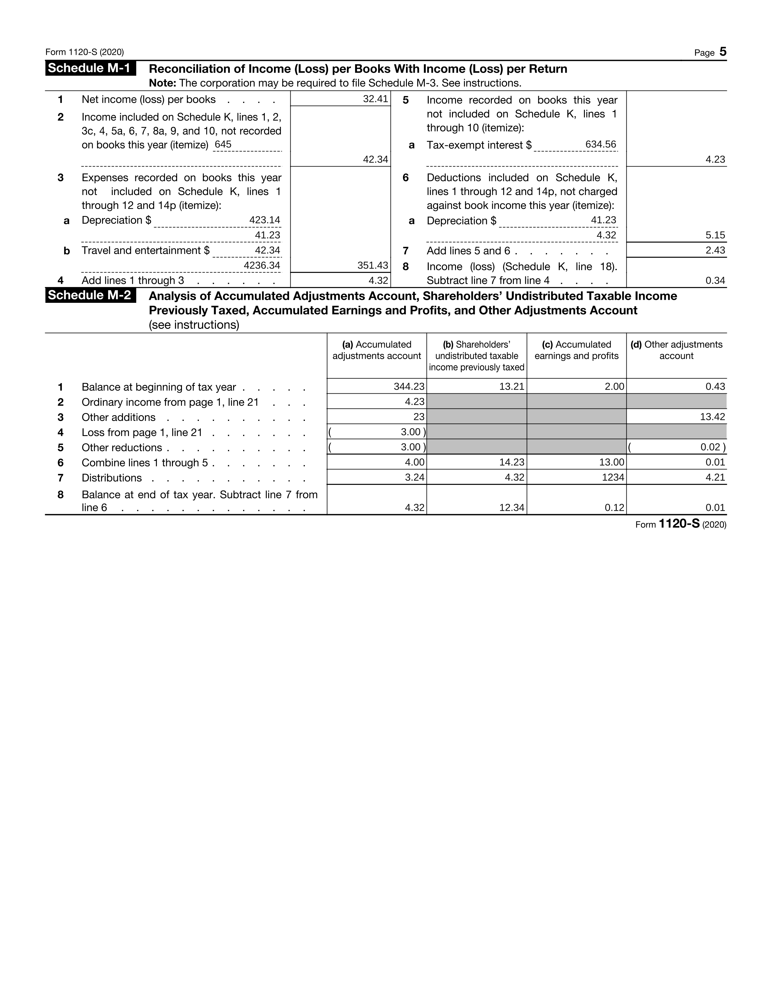


    Image #1:
    Origin: file:/home/ec2-user/f1120s.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


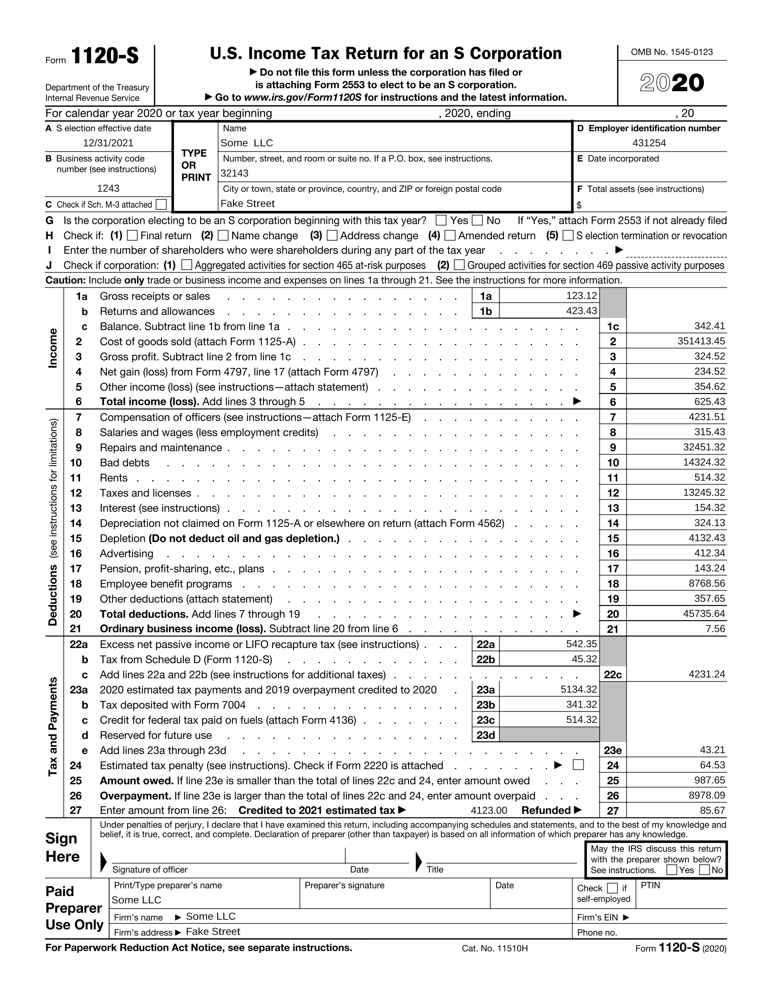


    Image #2:
    Origin: file:/home/ec2-user/f1120s.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


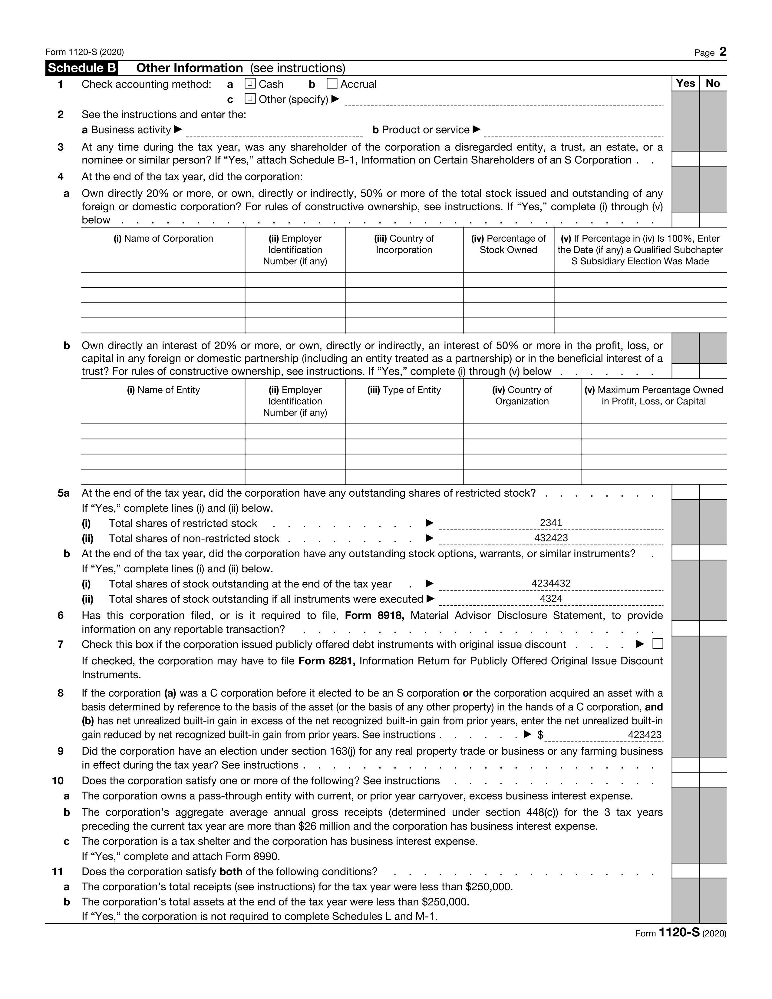


    Image #3:
    Origin: file:/home/ec2-user/f1120s.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


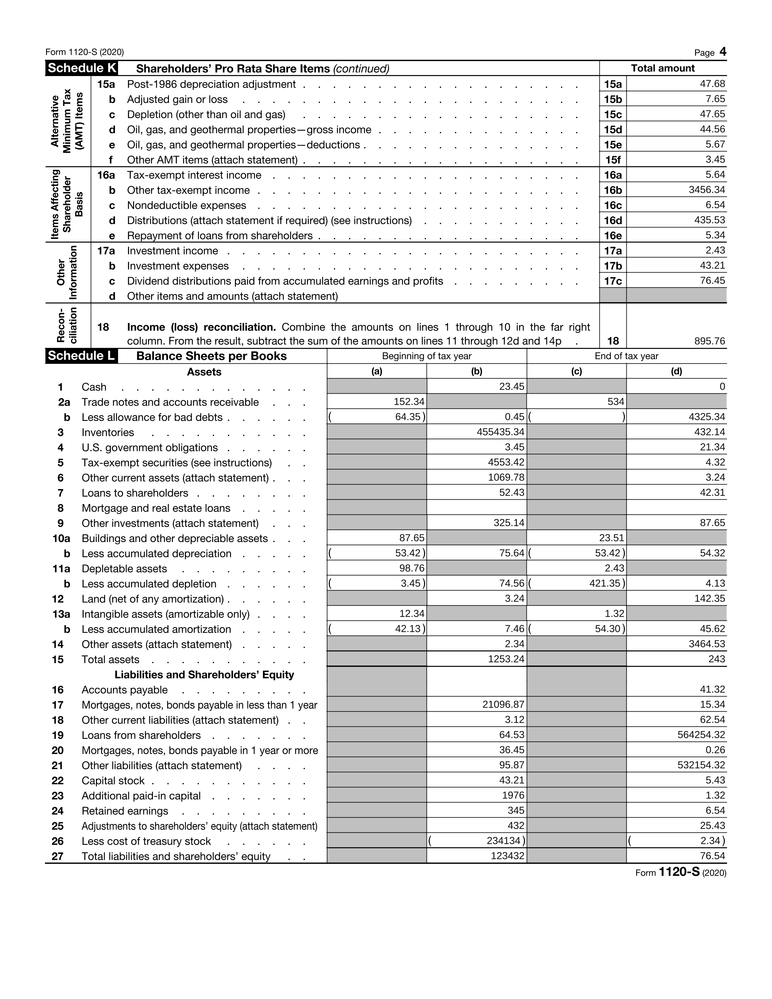


    Image #4:
    Origin: file:/home/ec2-user/f1120s.pdf
    Resolution: 300 dpi
    Width: 2550 px
    Height: 3299 px
    Mode: ImageType.TYPE_BYTE_GRAY
    Number of channels: 1


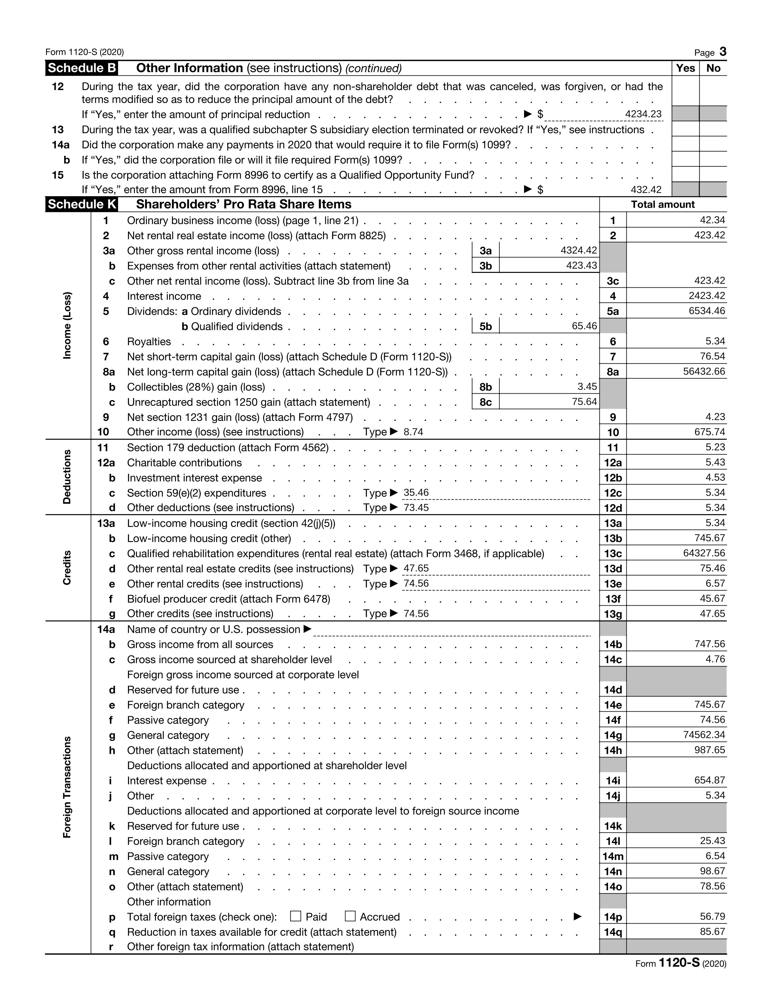

In [9]:
from sparkocr.utils import display_pdf

display_pdf(df)

In [10]:
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)
      print("======== End of page ===============")

Form 1120-S

Department of the Treasury Internal Revenue Service

U.S. Income Tax Return for an S Corporation

▶ Do not file this form unless the corporation has filed or is attaching Form 2553 to elect to be an S corporation. ▶ Go to www.irs.gov/Form1120S for instructions and the latest information.

 For calendar year 2020 or tax year beginning

, 2020, ending

, 20

 A S election effective date

12/31/2021

 B Business activity code number (see instructions)

1243

C Check if Sch. M-3 attached /Off

Name

 D  Employer identification number

Some  LLC 431254

Number, street, and room or suite no. If a P.O. box, see instructions.

32143

City or town, state or province, country, and ZIP or foreign postal code

Fake Street

 G Is the corporation electing to be an S corporation beginning with this tax year?

Yes No /Off /Off

If 'Yes,' attach Form 2553 if not already filed

 H Check if:

(1) Final return /Off

(2)

Name change /Off

(3) Address change /Off

(4) Amended return /Off

 I E

# Output format JSON

In [11]:
import json
imagePath = "/home/ec2-user/PubMed1_images_/*.jpg"
df = spark.read.format("binaryFile").load(imagePath)

bin_to_image = BinaryToImage() \
    .setInputCol("content") \
    .setOutputCol("image") \
    .setImageType(ImageType.TYPE_3BYTE_BGR)

df = bin_to_image.transform(df).cache()
df = df.limit(2)
proc = VisualDocumentProcessor() \
    .setInputCol("image") \
    .setOutputCols(["text", "tables"]) \
    .setOutputFormat(OcrOutputFormat.JSON) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)
result = proc.transform(df).cache()
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      parsed = json.loads(txt)
      print(json.dumps(parsed, indent=4))

10:14:03, INFO Run visual document processor
10:14:03, INFO Going to convert document batch...
10:14:03, WARNING Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
10:14:05, INFO Processing document tmp
10:15:32, INFO Finished converting document tmp in 89.28 sec.
10:15:32, INFO Run visual document processor
10:15:32, INFO Going to convert document batch...
10:15:32, WARNING Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.
10:15:35, INFO Processing document tmp
[Stage 33:>                                                         (0 + 1) / 1]

{
    "schema_name": "DoclingDocument",
    "version": "1.0.0",
    "name": "tmp",
    "origin": {
        "mimetype": "application/pdf",
        "binary_hash": 13445220864746338093,
        "filename": "tmp"
    },
    "furniture": {
        "self_ref": "#/furniture",
        "children": [],
        "name": "_root_",
        "label": "unspecified"
    },
    "body": {
        "self_ref": "#/body",
        "children": [
            {
                "$ref": "#/texts/0"
            },
            {
                "$ref": "#/texts/1"
            },
            {
                "$ref": "#/texts/2"
            },
            {
                "$ref": "#/texts/3"
            },
            {
                "$ref": "#/texts/4"
            },
            {
                "$ref": "#/texts/5"
            },
            {
                "$ref": "#/texts/6"
            },
            {
                "$ref": "#/texts/7"
            },
            {
                "$ref": "#/texts/8"
      

10:16:55, INFO Finished converting document tmp in 82.95 sec.
                                                                                

# PPTX case

In [12]:
pptxPath = "/home/ec2-user/pptx/*.pptx"
df = spark.read.format("binaryFile").load(pptxPath)
proc = VisualDocumentProcessor() \
    .setInputCol("content") \
    .setOutputCols(["text", "tables"]) \
    .setOcrEngine(VisualDocumentProcessorOcrEngines.EASYOCR)
result = proc.transform(df).cache()
for _, v in result.select("text").toPandas().iterrows():
  for txt in v["text"]:
      print(txt)

10:16:55, INFO Run visual document processor
10:16:55, INFO Going to convert document batch...
10:16:55, INFO Processing document tmp
10:16:55, INFO Finished converting document tmp in 0.03 sec.
10:16:58, INFO Run visual document processor
                       (1 + 1) / 2]

# Docling

Image test
# Test Table Slide

With footnote

|    | Class1          | Class1          | Class1   | Class2   | Class2   | Class2   |
|----|-----------------|-----------------|----------|----------|----------|----------|
|    | A merged with B | A merged with B | C        | A        | B        | C        |
| R1 | True            | False           |          | False    | True     | True     |
| R2 |                 |                 | True     | False    |          |          |
| R3 | False           |                 |          |          | False    |          |
| R3 |                 | True            |          | True     |          |          |
| R4 |                 |                 | False    |          | False    |          |
| R4 |                 | True            |          | True     | False    | False    |
| R4 | True            | False           | True     | False    | True     | False    |
# Second slide title

Let’s introduce a list

With foo

Bar

And baz thin

10:17:05, INFO Going to convert document batch...
10:17:05, INFO Processing document tmp
10:17:05, INFO Finished converting document tmp in 0.02 sec.
                                                                                